```
0,受胎告知,処女マリアがキリストを妊娠したことを告げられる  
1,キリストの降誕,イエス・キリストが誕生する  
2,聖家族,幼少年時代のイエス・キリスト、養父ヨセフ、聖母マリア  
3,羊飼いの礼拝,イエス・キリストを目にするために羊飼いが訪れる  
4,東方三博士の礼拝,マリアとイエス・キリストを拝み、乳香、没役、黄金を捧げる  
5,エジプトへの逃避,養父ヨセフは、ヘロデ王のたくらみを避けて、マリアとともにエジプトへと逃れる  
6,イエスの洗礼,ヨルダン川で洗礼者ヨハネからイエスは洗礼を受ける  
7,最後の晩餐,イエスが処刑される前夜、十二使徒と共に食事をしている。使徒の一人が裏切者であることが告げられる  
8,茨の冠,笞打ちの刑となったイエスが、兵士から茨でできた冠をかぶせられあざ笑われる  
9,キリストの磔刑,イエスは十字架に磔となって処刑される  
10,キリストの嘆き,キリストの体が十字架から剥がされ、その体をイエスの友人たちが悼む  
11,ラザロの復活,ラザロの墓の前で、イエスが祈った直後、イエスの友人であるラザロが蘇生する  
12,最後の審判,再臨したイエスが死者に裁きを下し、天国と地獄へと振り分けられる  
```

In [1]:
pip install japanize-matplotlib > /dev/null

You should consider upgrading via the '/venv/bin/python3.8 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import sys
sys.path.append("..")

%matplotlib inline

In [3]:
import os
from collections import Counter
from typing import *

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# sns.set_style("whitegrid")

In [4]:
import japanize_matplotlib
japanize_matplotlib.japanize()

In [5]:
from dataclasses import dataclass


@dataclass
class InputPath:
    _prefix: str = "../input"
    train_images: str = f"{_prefix}/christ-train-imgs.npz"
    train_labels: str = f"{_prefix}/christ-train-labels.npz"
    test_images: str = f"{_prefix}/christ-test-imgs.npz"
        
        
def load_npz(path: str) -> np.array:
    x = np.load(path)["arr_0"]
    print(f"{os.path.basename(path)}: {x.shape}")
    return x

In [6]:
train = load_npz(InputPath.train_images)
train_labels = load_npz(InputPath.train_labels)
test = load_npz(InputPath.test_images)

christ-train-imgs.npz: (654, 224, 224, 3)
christ-train-labels.npz: (654,)
christ-test-imgs.npz: (497, 224, 224, 3)


## EDA - metadata

### Train

/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


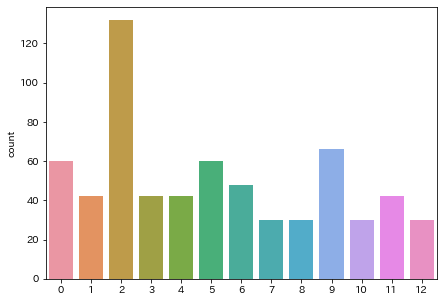

In [7]:
plt.figure(figsize=(7, 5))
sns.countplot(train_labels)
plt.show()

In [8]:
_df = pd.DataFrame.from_dict({k: [v] for k, v in dict(Counter(train_labels)).items()}).T
_df.columns = ["num"]
_df = _df.sort_index()
_df = _df.assign(pct=np.round(_df["num"]/_df["num"].sum()*100, 1))
_df

,num,pct
0,60,9.2
1,42,6.4
2,132,20.2
3,42,6.4
4,42,6.4
5,60,9.2
6,48,7.3
7,30,4.6
8,30,4.6
9,66,10.1


In [9]:
np.sum(train_labels == 2) / len(train_labels) * 100

20.18348623853211

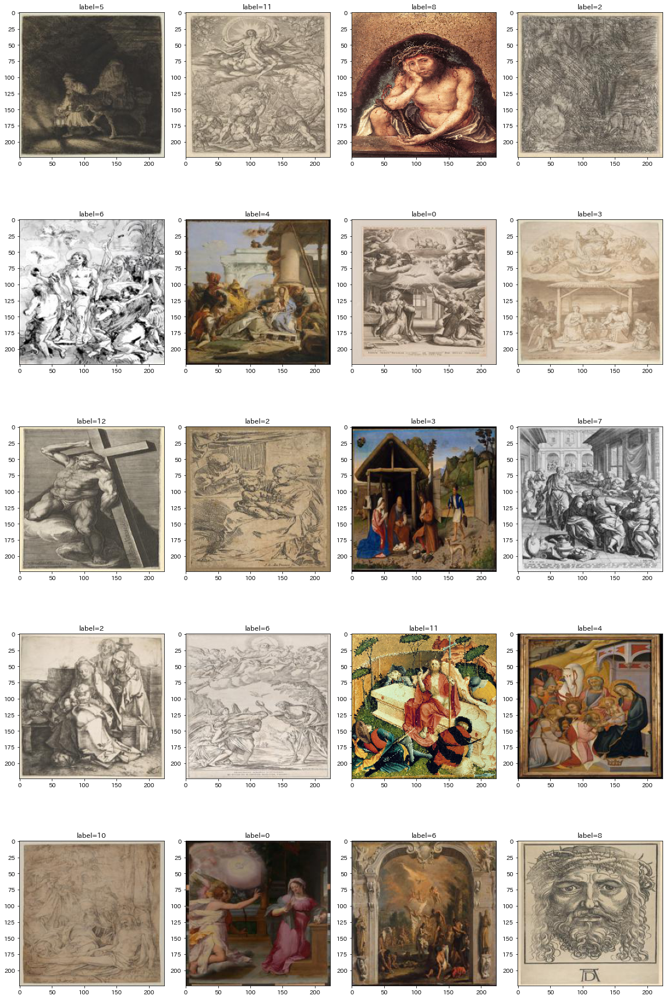

In [10]:
n = 5
c = 4
fig, axes = plt.subplots(n, c, figsize=(c*4, n*5))
for i in range(n * c):
    j = i // c
    k = i % c
    axes[j, k].imshow(train[i])
    axes[j, k].set_title(f"label={train_labels[i]}")
plt.tight_layout()
plt.show()
print("\n")

In [28]:
labels_dict = {
    0: {
        "title": "受胎告知",
        "description": "処女マリアがキリストを妊娠したことを告げられる",
        "example": "https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/Annunciation_%28Leonardo%29_%28cropped%29.jpg/800px-Annunciation_%28Leonardo%29_%28cropped%29.jpg",
    },
    1: {
        "title": "キリストの降誕",
        "description": "イエス・キリストが誕生する",
    },
    2: {
        "title": "聖家族",
        "description": "幼少年時代のイエス・キリスト、養父ヨセフ、聖母マリア",
    },
    3: {
        "title": "羊飼いの礼拝",
        "description": "イエス・キリストを目にするために羊飼いが訪れる",
    },
    4: {
        "title": "東方三博士の礼拝",
        "description": "マリアとイエス・キリストを拝み、乳香、没役、黄金を捧げる",
    },
    5: {
        "title": "エジプトへの逃避",
        "description": "養父ヨセフは、ヘロデ王のたくらみを避けて、マリアとともにエジプトへと逃れる",
    },
    6: {
        "title": "イエスの洗礼",
        "description": "ヨルダン川で洗礼者ヨハネからイエスは洗礼を受ける",
    },
    7: {
        "title": "最後の晩餐",
        "description": "イエスが処刑される前夜、十二使徒と共に食事をしている。使徒の一人が裏切者であることが告げられる",
    },
    8: {
        "title": "茨の冠",
        "description": "笞打ちの刑となったイエスが、兵士から茨でできた冠をかぶせられあざ笑われる",
    },
    9: {
        "title": "キリストの磔刑",
        "description": "イエスは十字架に磔となって処刑される",
    },
    10: {
        "title": "キリストの嘆き",
        "description": "キリストの体が十字架から剥がされ、その体をイエスの友人たちが悼む",
    },
    11: {
        "title": "ラザロの復活",
        "description": "ラザロの墓の前で、イエスが祈った直後、イエスの友人であるラザロが蘇生する",
    },
    12: {
        "title": "最後の審判",
        "description": "再臨したイエスが死者に裁きを下し、天国と地獄へと振り分けられる",
    },
}


def open_image_url(url):
    from IPython.display import Image 
    display(Image(url))

In [29]:
labels_dict

{0: {'title': '受胎告知',
  'description': '処女マリアがキリストを妊娠したことを告げられる',
  'example': 'https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/Annunciation_%28Leonardo%29_%28cropped%29.jpg/800px-Annunciation_%28Leonardo%29_%28cropped%29.jpg'},
 1: {'title': 'キリストの降誕', 'description': 'イエス・キリストが誕生する'},
 2: {'title': '聖家族', 'description': '幼少年時代のイエス・キリスト、養父ヨセフ、聖母マリア'},
 3: {'title': '羊飼いの礼拝', 'description': 'イエス・キリストを目にするために羊飼いが訪れる'},
 4: {'title': '東方三博士の礼拝', 'description': 'マリアとイエス・キリストを拝み、乳香、没役、黄金を捧げる'},
 5: {'title': 'エジプトへの逃避',
  'description': '養父ヨセフは、ヘロデ王のたくらみを避けて、マリアとともにエジプトへと逃れる'},
 6: {'title': 'イエスの洗礼', 'description': 'ヨルダン川で洗礼者ヨハネからイエスは洗礼を受ける'},
 7: {'title': '最後の晩餐',
  'description': 'イエスが処刑される前夜、十二使徒と共に食事をしている。使徒の一人が裏切者であることが告げられる'},
 8: {'title': '茨の冠', 'description': '笞打ちの刑となったイエスが、兵士から茨でできた冠をかぶせられあざ笑われる'},
 9: {'title': 'キリストの磔刑', 'description': 'イエスは十字架に磔となって処刑される'},
 10: {'title': 'キリストの嘆き', 'description': 'キリストの体が十字架から剥がされ、その体をイエスの友人たちが悼む'},
 11: {'title': 'ラザロの復活',
  'desc

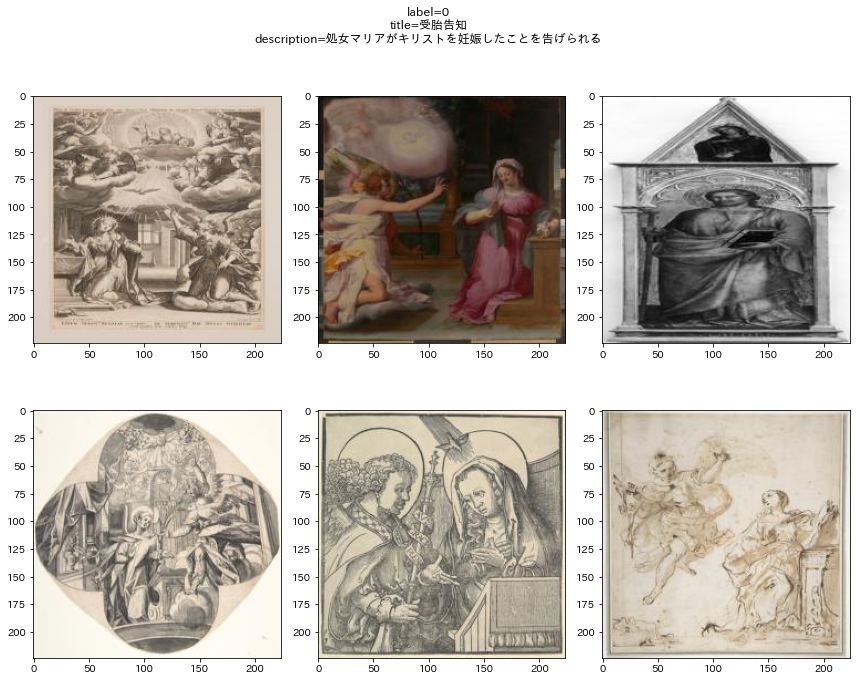

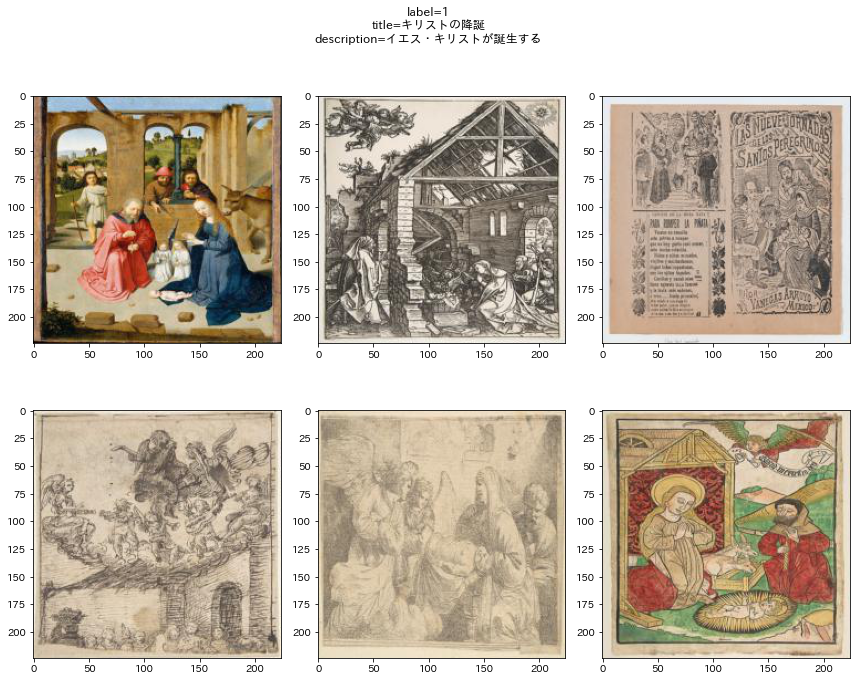

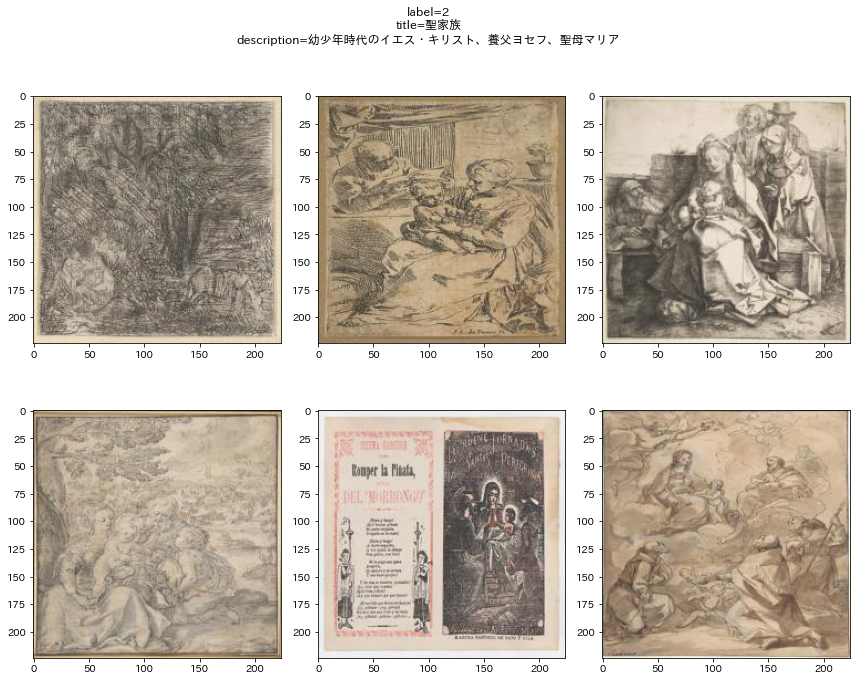

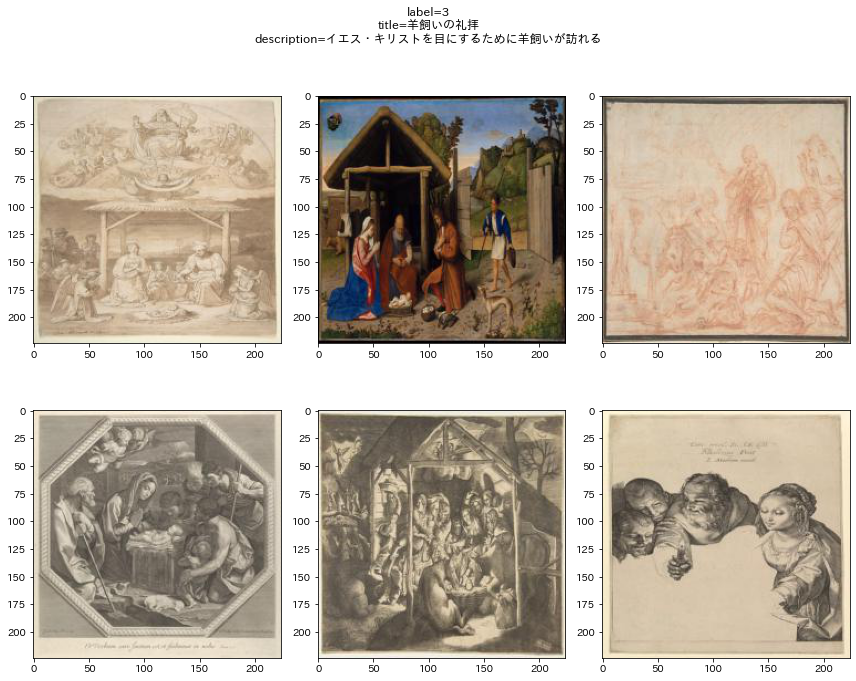

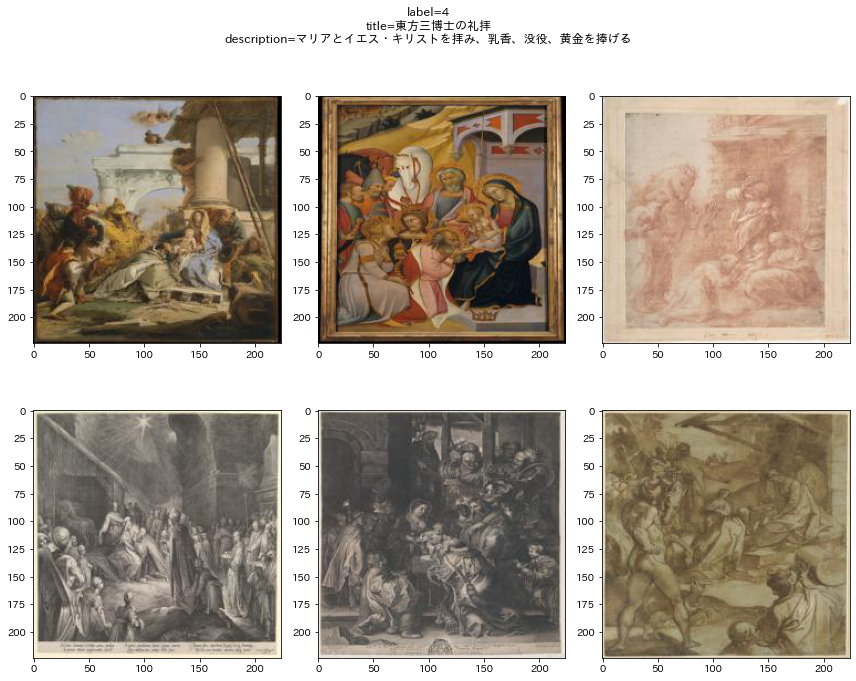

...

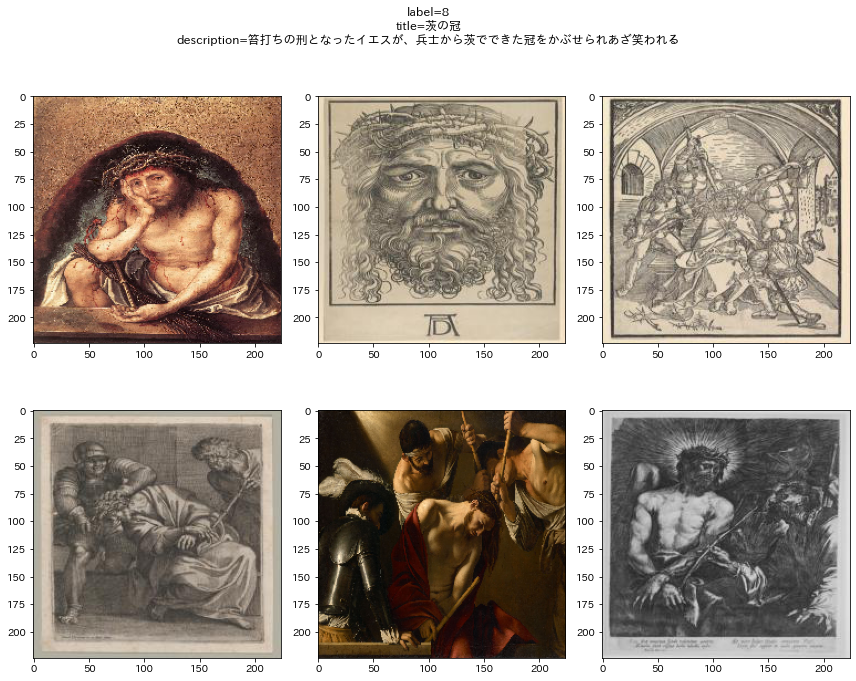

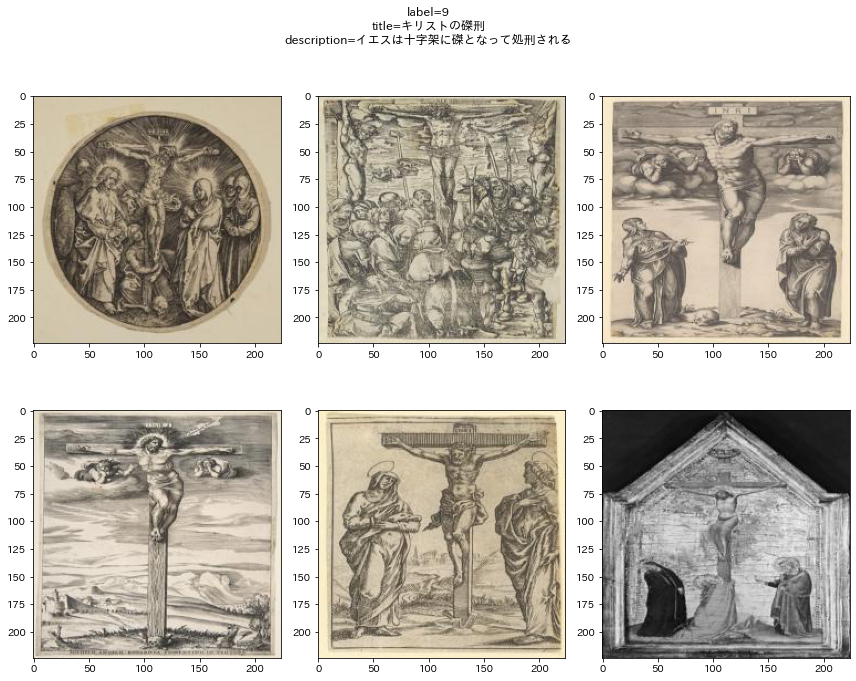

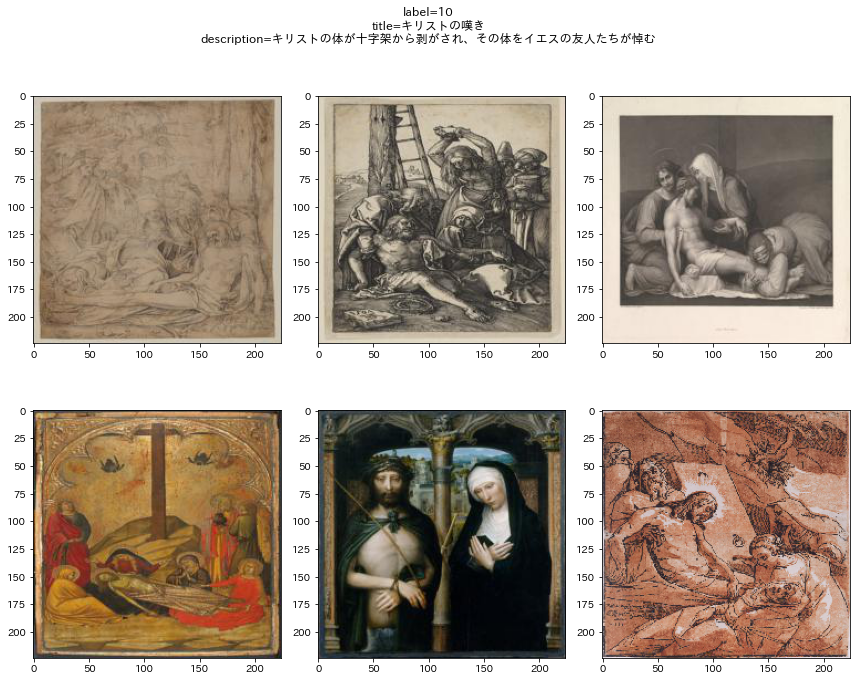

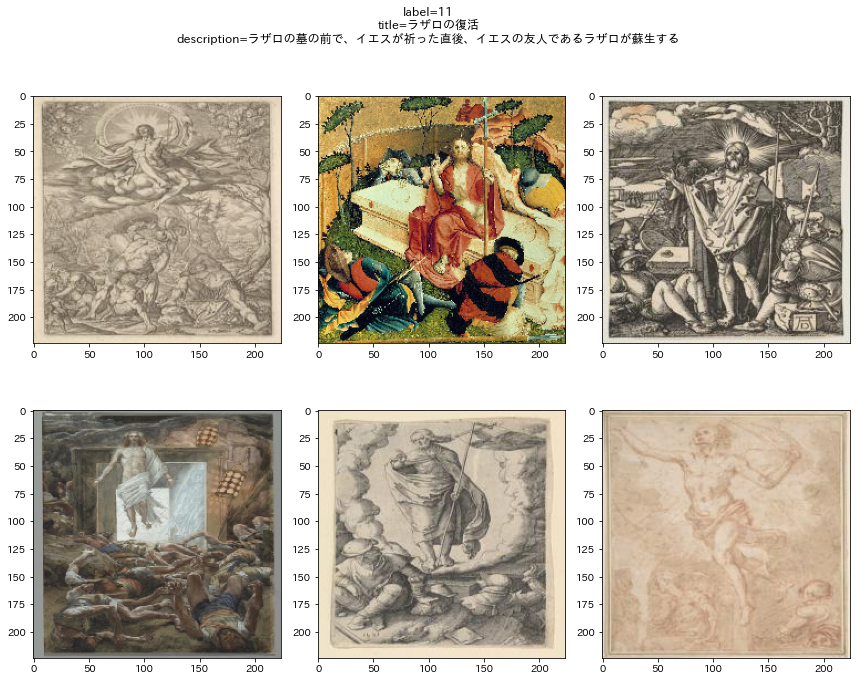

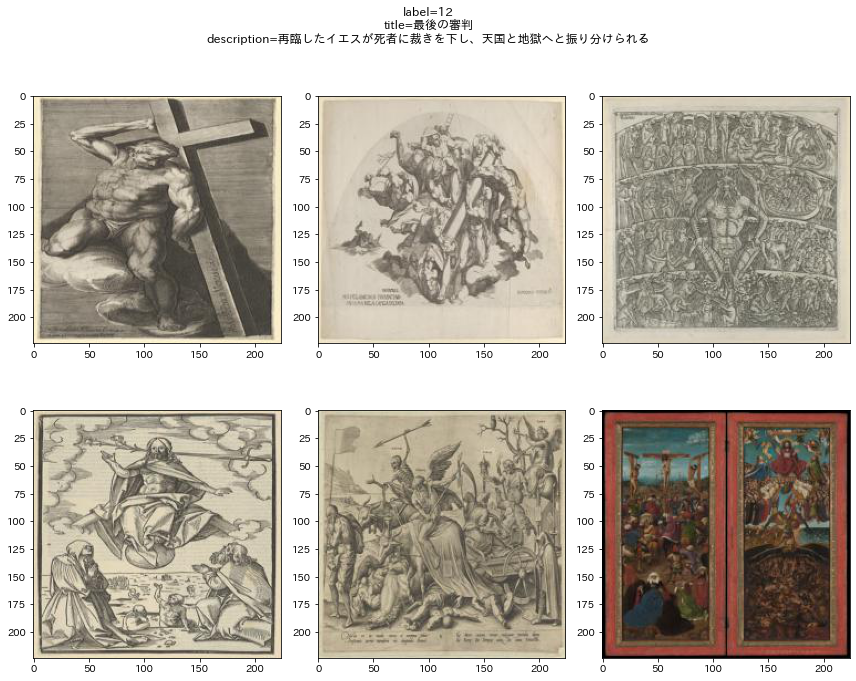

In [12]:
df_labels = pd.DataFrame(train_labels, columns=["label"])
for label in labels_dict.keys():
    n = 2
    c = 3
    fig, axes = plt.subplots(n, c, figsize=(c*4, n*5))
    for i in range(n * c):
        j = i // c
        k = i % c
        idx = df_labels[df_labels["label"]==label]["label"].index[i]
        axes[j, k].imshow(train[idx])
    plt.suptitle(f'label={label}\ntitle={labels_dict[label]["title"]}\ndescription={labels_dict[label]["description"]}')
    plt.tight_layout()
    plt.show()